In [1]:
import cv2
import torch
from torch.utils.data import DataLoader, TensorDataset, Dataset

import matplotlib.pyplot as plt
import numpy as np
import torchvision
import torchvision.transforms as transforms

import torch
import torch.nn as nn
import torch.nn.functional as F

from tqdm.notebook import tqdm
import time

In [2]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [3]:
# from google.colab import drive
# drive.mount('/content/drive')

In [4]:
l_images_1 = np.load(r"C:\Users\Vikash kumar singh\Desktop\dataset\pclub_b&w\l\gray_scale.npy")[:5000]
ab_images_1 = np.load(r"C:\Users\Vikash kumar singh\Desktop\dataset\pclub_b&w\ab\ab\ab1.npy")[:5000]
# l_images_2 = np.load(r"C:\Users\Vikash kumar singh\Desktop\dataset\pclub_b&w\l\gray_scale.npy")[5000:10000]
# ab_images_2 = np.load(r"C:\Users\Vikash kumar singh\Desktop\dataset\pclub_b&w\ab\ab\ab1.npy")[5000:]
# l_images_3 = np.load(r"C:\Users\Vikash kumar singh\Desktop\dataset\pclub_b&w\l\gray_scale.npy")[10000:15000]
# ab_images_3 = np.load(r"C:\Users\Vikash kumar singh\Desktop\dataset\pclub_b&w\ab\ab\ab2.npy")[:5000]
# l_images_4 = np.load(r"C:\Users\Vikash kumar singh\Desktop\dataset\pclub_b&w\l\gray_scale.npy")[15000:20000]
# ab_images_4 = np.load(r"C:\Users\Vikash kumar singh\Desktop\dataset\pclub_b&w\ab\ab\ab2.npy")[5000:]

In [5]:
l_images = l_images_1
ab_images = ab_images_1

In [6]:
print(f"L images shape: {l_images.shape}, AB images shape: {ab_images.shape}")

L images shape: (5000, 224, 224), AB images shape: (5000, 224, 224, 2)


In [7]:
def convert_lab_to_rgb(l_images, ab_images):
    num_images = min(l_images.shape[0], ab_images.shape[0])
    rgb_images = []

    for i in range(num_images):
        l_channel = l_images[i]
        ab_channels = ab_images[i]

        # Create an empty LAB image
        img = np.zeros((224, 224, 3))
        img[:, :, 0] = l_channel
        img[:, :, 1:] = ab_channels

        # Convert LAB to RGB
        rgb_image = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_LAB2RGB)
        rgb_images.append(rgb_image)

    return rgb_images

In [8]:
rgb_images = convert_lab_to_rgb(l_images,ab_images)

In [9]:
rgb_images_np = np.array(rgb_images)
print(f"rgb images shape: {rgb_images_np.shape}")

rgb images shape: (5000, 224, 224, 3)


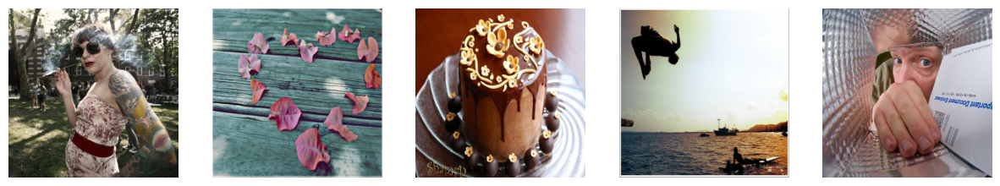

In [10]:
fig, axes = plt.subplots(1, 5, figsize=(15, 3))
for i in range(5):
    axes[i].imshow(rgb_images_np[i])
    axes[i].axis('off')

In [11]:
l_images = l_images[:, np.newaxis, :, :]
l_images_tensor = torch.from_numpy(l_images).float().to(device)
print(l_images_tensor.shape)

torch.Size([5000, 1, 224, 224])


In [12]:
rgb_images_tensor= torch.from_numpy(rgb_images_np).float().to(device)
rgb_images_tensor = rgb_images_tensor.permute(0, 3, 1, 2)
print(rgb_images_tensor.shape)

torch.Size([5000, 3, 224, 224])


In [13]:
transform = transforms.Compose([
    transforms.Lambda(lambda x: x / 255.0),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])  
])

transform_l = transforms.Compose([
    transforms.Lambda(lambda x: x / 255.0),  
    transforms.Normalize(mean=[0.5], std=[0.5])  
])

In [14]:
rgb_images_tensor = transform(rgb_images_tensor)
l_images_tensor = transform_l(l_images_tensor)
torch.cuda.empty_cache()

print(torch.min(rgb_images_tensor))
print(torch.max(rgb_images_tensor))
print(torch.min(l_images_tensor))
print(torch.max(l_images_tensor))

tensor(-1., device='cuda:0')
tensor(1., device='cuda:0')
tensor(-1., device='cuda:0')
tensor(1., device='cuda:0')


In [15]:
dis_dataset = TensorDataset(rgb_images_tensor)

batch_size = 32

dis_data_loader = DataLoader(dis_dataset, batch_size=batch_size, shuffle=True)

for batch in dis_data_loader:
    batch_images = batch[0]
    print("Batch shape:", batch_images.shape)
    break


Batch shape: torch.Size([32, 3, 224, 224])


In [16]:
gen_dataset = TensorDataset(l_images_tensor)

gen_data_loader = DataLoader(gen_dataset, batch_size=batch_size,shuffle=True)

for batch in gen_data_loader:
    batch_images = batch[0]
    print("Batch shape:", batch_images.shape)
    break

Batch shape: torch.Size([32, 1, 224, 224])


In [17]:
class RGB_L_Dataset(Dataset):
    def __init__(self, l_images, rgb_images):
        self.l_images = l_images
        self.rgb_images = rgb_images

    def __len__(self):
        return len(self.l_images)

    def __getitem__(self, idx):
        l_img = self.l_images[idx]
        rgb_img = self.rgb_images[idx]

        return rgb_img, l_img

In [18]:
class Generator(nn.Module):
    def down(self,in_ch,out_ch):
        return nn.Sequential(
            nn.Conv2d(in_ch,out_ch,kernel_size=3,stride=2),
            nn.BatchNorm2d(out_ch),
            nn.LeakyReLU(0.2)
        )

    def up(self,in_ch,out_ch,kernel_size=3):
            return nn.Sequential(
                nn.ConvTranspose2d(in_ch,out_ch,kernel_size,stride=2),
                nn.BatchNorm2d(out_ch),
                nn.LeakyReLU(0.2)
            )

    def res(self,in_ch,out_ch):
         return nn.Sequential(
              nn.Conv2d(in_ch,out_ch,kernel_size=3,stride=1,padding=1,bias=False),
         )

    def __init__(self):
        super().__init__()
        # downsampling
        self.down1 = self.down(1,4)
        self.down2 = self.down(4,16)
        self.res1  = self.res(16,16)
        self.down3 = self.down(16,32)
        self.res2  = self.res(32,32)
        self.down4 = self.down(32,64)
        self.res3  = self.res(64,64)
        self.down5 = self.down(64,128)
        self.down6 = self.down(128,256)

        # upsampling
        self.up1 = self.up(256,128,4)
        self.up2 = self.up(256,64)
        self.up3 = self.up(128,32)
        self.up4 = self.up(64,16)
        self.up5 = self.up(32,4)
        self.up6 = self.up(8,3)

        self.Upsample = nn.Upsample(size=(224, 224), mode='bilinear', align_corners=True)
        self.tanh = nn.Tanh()

    def forward(self,x):
        # downsampling
        x1 = self.down1(x)
        x2 = self.down2(x1)
        x2 = self.res1(x2)
        x3 = self.down3(x2)
        x3 = self.res2(x3)
        x4 = self.down4(x3)
        x4 = self.res3(x4)
        x5 = self.down5(x4)
        x6 = self.down6(x5)

        # upsampling
        y1 = self.up1(x6)
        y1 = torch.cat((y1,x5),dim=1)
        y2 = self.up2(y1)
        y2 = torch.cat((y2,x4),dim=1)
        y3 = self.up3(y2)
        y3 = torch.cat((y3,x3),dim=1)
        y4 = self.up4(y3)
        y4 = torch.cat((y4,x2),dim=1)
        y5 = self.up5(y4)
        y5 = torch.cat((y5,x1),dim=1)
        y6 = self.up6(y5)
        return self.tanh(self.Upsample(y6))



In [19]:
class Discriminator(nn.Module):
    def down(self,in_ch,out_ch):
        return nn.Sequential(
            nn.Conv2d(in_ch,out_ch,kernel_size=3,stride=2),
            nn.BatchNorm2d(out_ch),
            nn.LeakyReLU(0.2)
        )


    def __init__(self):
        super().__init__()
        # downsampling
        self.down1 = self.down(3,4)
        self.down2 = self.down(4,16)
        self.down3 = self.down(16,32)
        self.down4 = self.down(32,64)
        self.down5 = self.down(64,128)
        self.down6 = self.down(128,256)

        self.pool = nn.MaxPool2d(1)
        self.flat = nn.Flatten()
        self.lin1 = nn.Linear(1024,1)
        self.sig = nn.Sigmoid()

    def forward(self,x):
        # downsampling
        x1 = self.down1(x)
        x2 = self.down2(x1)
        x3 = self.down3(x2)
        x4 = self.down4(x3)
        x5 = self.down5(x4)
        x6 = self.down6(x5)
        y1 = self.pool(x6)
        y2 = self.flat(y1)
        y3 = self.lin1(y2)
        y4 = self.sig(y3)
        return y4

In [20]:
import torch.nn as nn

def _weights_init_gen(m):
    if isinstance(m, (nn.Conv2d, nn.ConvTranspose2d)):
        # Initialize Conv2d and ConvTranspose2d weights with a normal distribution (mean=0, std=0.02)
        nn.init.normal_(m.weight, mean=0.0, std=0.02)
        if m.bias is not None:
            nn.init.constant_(m.bias, 0)

    if isinstance(m, nn.BatchNorm2d):
        # Initialize BatchNorm2d weights with a normal distribution (mean=1, std=0.02)
        nn.init.normal_(m.weight, mean=1.0, std=0.02)
        # Initialize the bias with zeros
        nn.init.constant_(m.bias, 0)

In [21]:
generator = Generator().to(device)
generator.apply(_weights_init_gen)

Generator(
  (down1): Sequential(
    (0): Conv2d(1, 4, kernel_size=(3, 3), stride=(2, 2))
    (1): BatchNorm2d(4, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2)
  )
  (down2): Sequential(
    (0): Conv2d(4, 16, kernel_size=(3, 3), stride=(2, 2))
    (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2)
  )
  (res1): Sequential(
    (0): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  )
  (down3): Sequential(
    (0): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2)
  )
  (res2): Sequential(
    (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  )
  (down4): Sequential(
    (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2))
    (1): BatchNorm2d(64, eps=1e-05, momentu

In [22]:
discriminator  = Discriminator().to(device)
discriminator

Discriminator(
  (down1): Sequential(
    (0): Conv2d(3, 4, kernel_size=(3, 3), stride=(2, 2))
    (1): BatchNorm2d(4, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2)
  )
  (down2): Sequential(
    (0): Conv2d(4, 16, kernel_size=(3, 3), stride=(2, 2))
    (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2)
  )
  (down3): Sequential(
    (0): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2)
  )
  (down4): Sequential(
    (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2)
  )
  (down5): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2))
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1,

In [23]:
for batch in gen_data_loader:
    inputs = batch[0].to(device)
    output = generator(inputs)
    print("Generator Output Shape:", output.shape)
    print("Generator Output Max Value:", torch.max(output).item())
    print("Generator Output Min Value:", torch.min(output).item())
    break

Generator Output Shape: torch.Size([32, 3, 224, 224])
Generator Output Max Value: 1.0
Generator Output Min Value: -0.966748833656311


In [24]:
for batch in dis_data_loader:
    inputs = batch[0].to(device)
    output = discriminator(inputs)
    print("Discriminator Output Shape:", output.shape)
    print("Discriminator Output Max Value:", torch.max(output).item())
    print("Discriminator Output Min Value:", torch.min(output).item())
    break

Discriminator Output Shape: torch.Size([32, 1])
Discriminator Output Max Value: 0.6725022792816162
Discriminator Output Min Value: 0.2818848788738251


In [25]:
import numpy as np
import matplotlib.pyplot as plt

def show_images(rgb_image1, l_image, rgb_image2):
    if rgb_image1.is_cuda:
        rgb_image1 = rgb_image1.cpu()
    if l_image.is_cuda:
        l_image = l_image.cpu()
    if rgb_image2.is_cuda:
        rgb_image2 = rgb_image2.cpu()

    rgb_np1 = rgb_image1.detach().numpy()  
    l_np = l_image.detach().numpy()        
    rgb_np2 = rgb_image2.detach().numpy() 

    rgb_np1 = np.transpose(rgb_np1, (1, 2, 0)).clip(-1, 1)  
    rgb_np1 = ((rgb_np1 + 1) * 127.5).clip(0, 255).astype(np.uint8) 

    l_np = np.transpose(l_np, (1, 2, 0)).clip(-1, 1) 
    l_np = ((l_np + 1) * 127.5).clip(0, 255).astype(np.uint8) 

    rgb_np2 = np.transpose(rgb_np2, (1, 2, 0)).clip(-1, 1) 
    rgb_np2 = ((rgb_np2 + 1) * 127.5).clip(0, 255).astype(np.uint8) 

    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(rgb_np1)
    plt.axis('off')
    plt.title('RGB Image 1')

    plt.subplot(1, 3, 2)
    plt.imshow(l_np, cmap='gray')
    plt.axis('off')
    plt.title('L Channel Image')

    plt.subplot(1, 3, 3)
    plt.imshow(rgb_np2)
    plt.axis('off')
    plt.title('RGB Image 2')

    plt.tight_layout()
    plt.show()



In [26]:
def save_checkpoint(epoch, model, optimizer, loss, filename):
    torch.save({
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'loss': loss,
    }, filename)
    print(f"Model saved at epoch {epoch+1}")

In [27]:
dataset = RGB_L_Dataset(l_images_tensor, rgb_images_tensor)
train_dl = DataLoader(dataset, batch_size=32, shuffle=True)

In [28]:
loss_d = nn.BCELoss()
loss_g_1 = nn.BCELoss()
loss_g_2 = nn.L1Loss()
initial_epoch = 0

In [29]:
def train_discriminator(rgb_images,l_images,opt_d):

    smooth = 0.1
    opt_d.zero_grad()

    #pass real images through discriminator
    real_preds=discriminator(rgb_images)
    real_loss=loss_d(real_preds, ((1 - smooth) * torch.ones_like(real_preds).to(device)))

    #generate fake images
    fake_images=generator(l_images)

    #pass fake images through discriminator
    fake_preds=discriminator(fake_images)
    fake_loss=loss_d(fake_preds,(torch.zeros_like(real_preds).to(device)))

    #update discriminator weights
    loss=real_loss+fake_loss
    loss.backward()
    opt_d.step()

    return loss.item(),real_loss,fake_loss,fake_images

In [30]:
def train_generator(rgb_images,l_images,opt_g):

    g_lambda = 100
    opt_g.zero_grad()

    #generate fake images
    fake_images=generator(l_images)

    #try to fool discriminator
    preds=discriminator(fake_images)
    fake_loss=loss_g_1(preds,(torch.ones_like(preds).to(device)))

    distance_loss=g_lambda*loss_g_2(fake_images,rgb_images)

    #update generator weights
    loss=fake_loss+distance_loss
    loss.backward()
    opt_g.step()

    return loss.item(),fake_loss,distance_loss

In [65]:
generator = Generator().to(device)
discriminator = Discriminator().to(device)

gen_checkpoint = torch.load(r"gen\gen126.pth")
generator.load_state_dict(gen_checkpoint['model_state_dict'])
generator.train()

dis_checkpoint = torch.load(r"dis\dis126.pth")
discriminator.load_state_dict(dis_checkpoint['model_state_dict'])
discriminator.train()

initial_epoch = gen_checkpoint['epoch'] + 1



C:\Users\Vikash kumar singh\AppData\Local\Temp\ipykernel_21160\3882377516.py:4: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  gen_checkpoint = torch.load(r"gen\gen126.pth")


In [68]:
def fit(epochs, lr=0.0002, start_idx=1):
    torch.cuda.empty_cache()

    losses_g = []
    losses_d = []
    fake_losses_g = []
    distance_losses_g = []
    fake_losses_d = []
    real_losses_d = []

    opt_d = torch.optim.Adam(discriminator.parameters(), betas=(0.5, 0.999), lr=lr * 0.5)

    opt_g = torch.optim.Adam(generator.parameters(), betas=(0.5, 0.999), lr=lr)

    scheduler_g = torch.optim.lr_scheduler.ReduceLROnPlateau(opt_g, mode='min', factor=0.25, patience=7, verbose=True)
    scheduler_d = torch.optim.lr_scheduler.ReduceLROnPlateau(opt_d, mode='min', factor=0.25, patience=7, verbose=True) 

    # Start the timer
    start_time = time.time()

    for epoch in range(initial_epoch,epochs):
        total_loss_g = 0.0
        total_loss_d = 0.0
        total_real_loss_d = 0.0
        total_fake_loss_d = 0.0
        total_fake_loss_g = 0.0
        total_distance_loss_g = 0.0
        num_batches = len(train_dl)

        for rgb_images, l_images in tqdm(train_dl):
            # Train discriminator
            loss_d, real_loss_d, fake_loss_d, fake_images = train_discriminator(rgb_images, l_images, opt_d)
            # Train generator
            loss_g, fake_loss_g, distance_loss_g = train_generator(rgb_images, l_images, opt_g)

            total_loss_d += loss_d
            total_loss_g += loss_g
            total_real_loss_d += real_loss_d
            total_fake_loss_d += fake_loss_d
            total_fake_loss_g += fake_loss_g
            total_distance_loss_g += distance_loss_g

        # Compute mean losses
        mean_loss_g = total_loss_g / num_batches
        mean_loss_d = total_loss_d / num_batches
        mean_real_loss_d = total_real_loss_d / num_batches
        mean_fake_loss_d = total_fake_loss_d / num_batches
        mean_fake_loss_g = total_fake_loss_g / num_batches
        mean_distance_loss_g = total_distance_loss_g / num_batches

        scheduler_g.step(mean_loss_g)
        scheduler_d.step(mean_loss_d)

        # Record losses & scores
        losses_g.append(mean_loss_g)
        losses_d.append(mean_loss_d)
        real_losses_d.append(mean_real_loss_d)
        fake_losses_d.append(mean_fake_loss_d)
        fake_losses_g.append(mean_fake_loss_g)
        distance_losses_g.append(mean_distance_loss_g)

        # End the timer
        end_time = time.time()
        total_duration = end_time - start_time

        # Log mean losses & scores
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_loss_d: {:.4f}, fake_loss_d: {:.4f}, fake_loss_g: {:.4f}, distance_loss_g: {:.4f}, duration: {:.4f}".format(
            epoch+1, epochs, mean_loss_g, mean_loss_d, mean_real_loss_d, mean_fake_loss_d, mean_fake_loss_g, mean_distance_loss_g, total_duration))

        show_images(rgb_images[0], l_images[0], fake_images[0])

        # Save models
        if epoch % 5 == 0:
            save_checkpoint(epoch, generator, opt_g, mean_loss_g, filename=f"new_check/gen/gen{epoch+1}.pth")
            save_checkpoint(epoch, discriminator, opt_d, mean_loss_d, filename=f"new_check/dis/dis{epoch+1}.pth")

    return losses_g, losses_d, real_losses_d, fake_losses_d, fake_losses_g, distance_losses_g


  0%|          | 0/157 [00:00<?, ?it/s]

Epoch [127/151], loss_g: 17.3591, loss_d: 1.0892, real_loss_d: 0.5486, fake_loss_d: 0.5406, fake_loss_g: 2.1042, distance_loss_g: 15.2549, duration: 86.1904


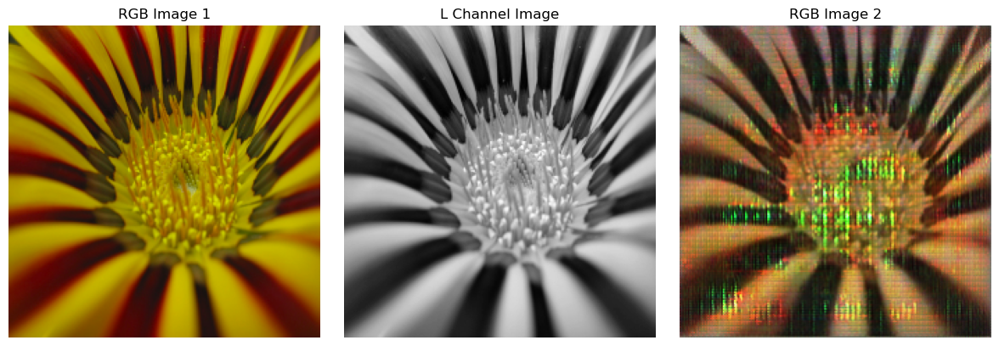

  0%|          | 0/157 [00:00<?, ?it/s]

Epoch [128/151], loss_g: 17.3521, loss_d: 1.2586, real_loss_d: 0.7438, fake_loss_d: 0.5147, fake_loss_g: 1.7910, distance_loss_g: 15.5611, duration: 176.4151


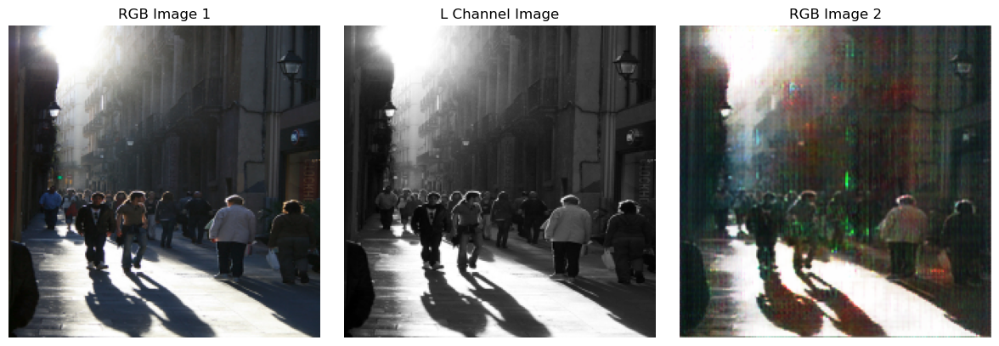

  0%|          | 0/157 [00:00<?, ?it/s]

Epoch [129/151], loss_g: 17.2076, loss_d: 1.2505, real_loss_d: 0.7684, fake_loss_d: 0.4821, fake_loss_g: 1.6359, distance_loss_g: 15.5717, duration: 270.0428


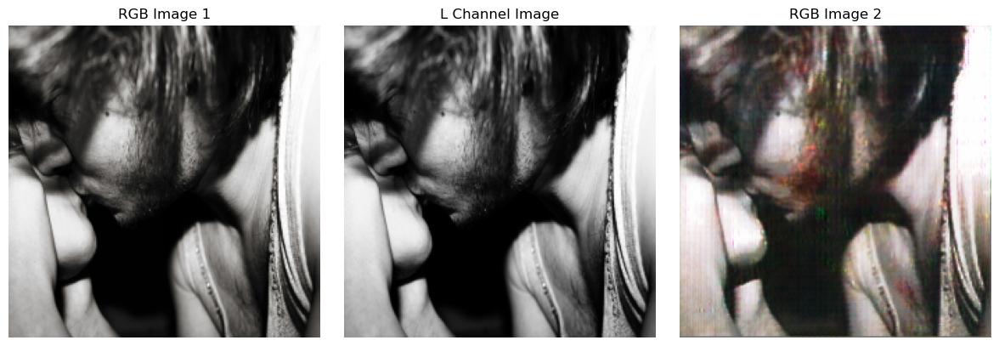

  0%|          | 0/157 [00:00<?, ?it/s]

Epoch [130/151], loss_g: 16.8044, loss_d: 1.2814, real_loss_d: 0.7741, fake_loss_d: 0.5073, fake_loss_g: 1.4504, distance_loss_g: 15.3540, duration: 376.2026


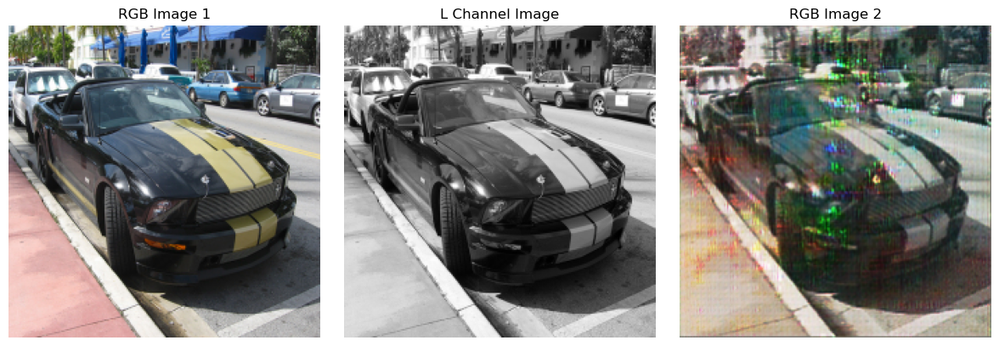

  0%|          | 0/157 [00:00<?, ?it/s]

Epoch [131/151], loss_g: 16.8004, loss_d: 1.1781, real_loss_d: 0.7209, fake_loss_d: 0.4572, fake_loss_g: 1.5350, distance_loss_g: 15.2654, duration: 483.1033


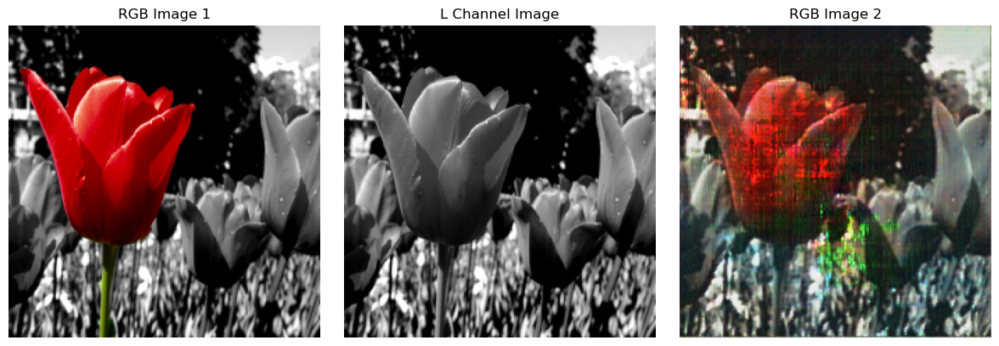

Model saved at epoch 131
Model saved at epoch 131


  0%|          | 0/157 [00:00<?, ?it/s]

Epoch [132/151], loss_g: 16.6481, loss_d: 1.1973, real_loss_d: 0.7235, fake_loss_d: 0.4737, fake_loss_g: 1.5004, distance_loss_g: 15.1477, duration: 576.9258


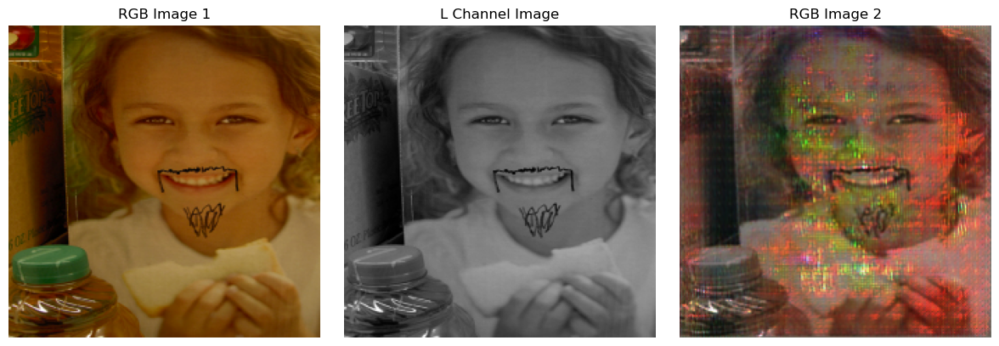

  0%|          | 0/157 [00:00<?, ?it/s]

Epoch [133/151], loss_g: 16.3469, loss_d: 1.1929, real_loss_d: 0.7260, fake_loss_d: 0.4668, fake_loss_g: 1.4745, distance_loss_g: 14.8724, duration: 677.9089


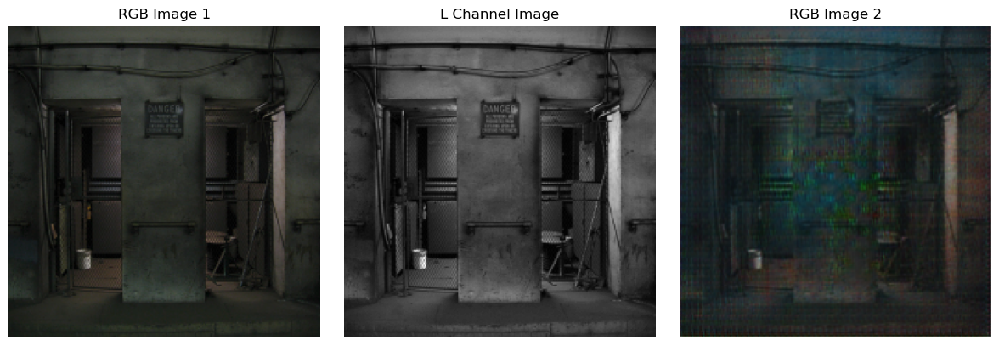

  0%|          | 0/157 [00:00<?, ?it/s]

Epoch [134/151], loss_g: 16.4256, loss_d: 1.1864, real_loss_d: 0.7209, fake_loss_d: 0.4655, fake_loss_g: 1.4976, distance_loss_g: 14.9280, duration: 768.9905


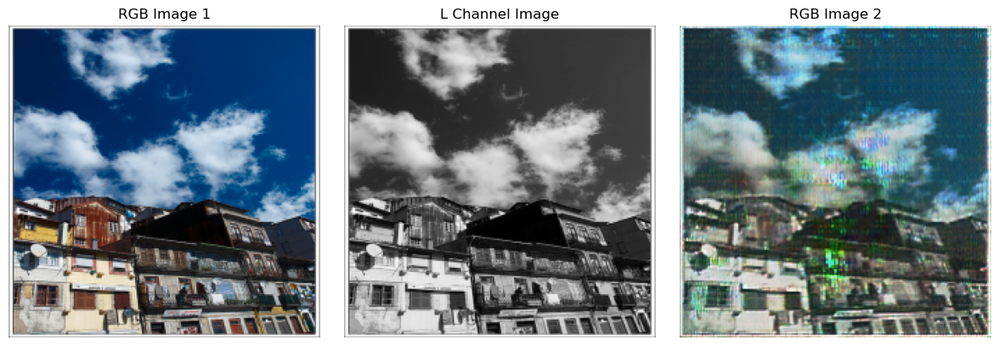

  0%|          | 0/157 [00:00<?, ?it/s]

Epoch [135/151], loss_g: 16.2273, loss_d: 1.0970, real_loss_d: 0.6783, fake_loss_d: 0.4187, fake_loss_g: 1.5382, distance_loss_g: 14.6891, duration: 873.5196


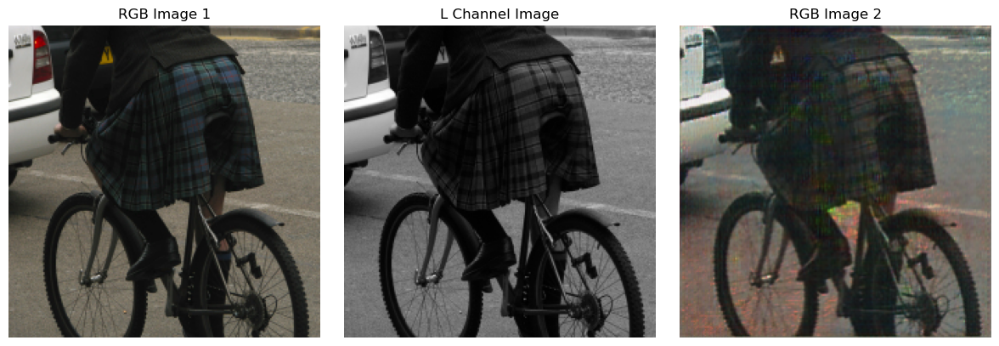

  0%|          | 0/157 [00:00<?, ?it/s]

Epoch [136/151], loss_g: 15.6308, loss_d: 1.4745, real_loss_d: 0.7767, fake_loss_d: 0.6977, fake_loss_g: 1.0025, distance_loss_g: 14.6283, duration: 967.0516


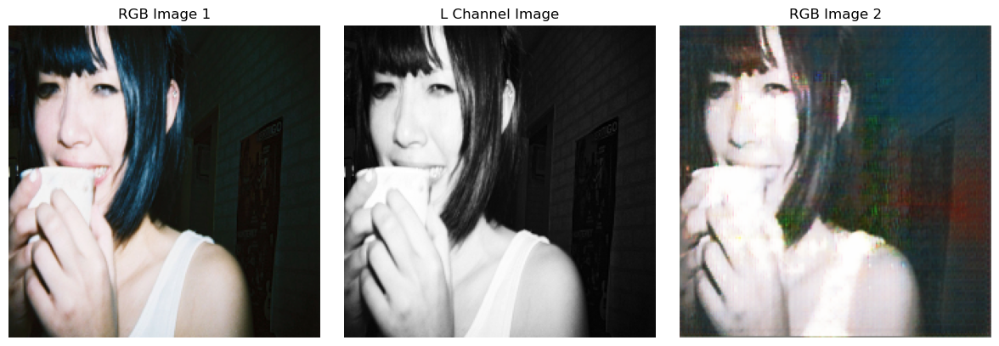

Model saved at epoch 136
Model saved at epoch 136


  0%|          | 0/157 [00:00<?, ?it/s]

Epoch [137/151], loss_g: 15.4746, loss_d: 1.5166, real_loss_d: 0.8682, fake_loss_d: 0.6484, fake_loss_g: 0.9976, distance_loss_g: 14.4770, duration: 1072.1109


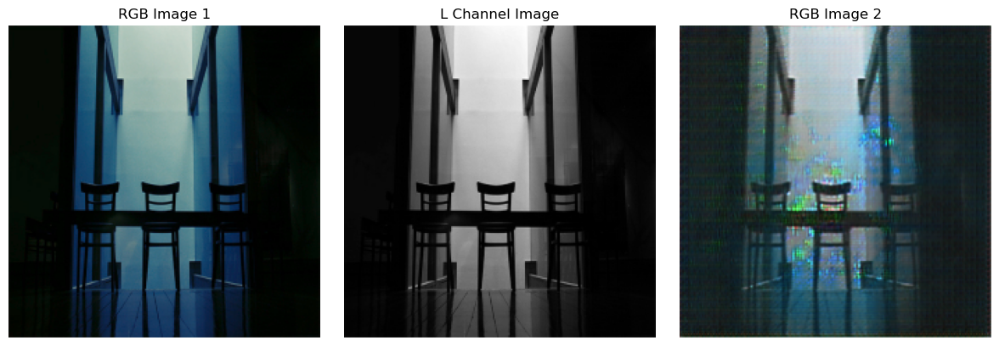

  0%|          | 0/157 [00:00<?, ?it/s]

Epoch [138/151], loss_g: 15.1624, loss_d: 1.4862, real_loss_d: 0.8639, fake_loss_d: 0.6222, fake_loss_g: 0.9826, distance_loss_g: 14.1798, duration: 1170.9552


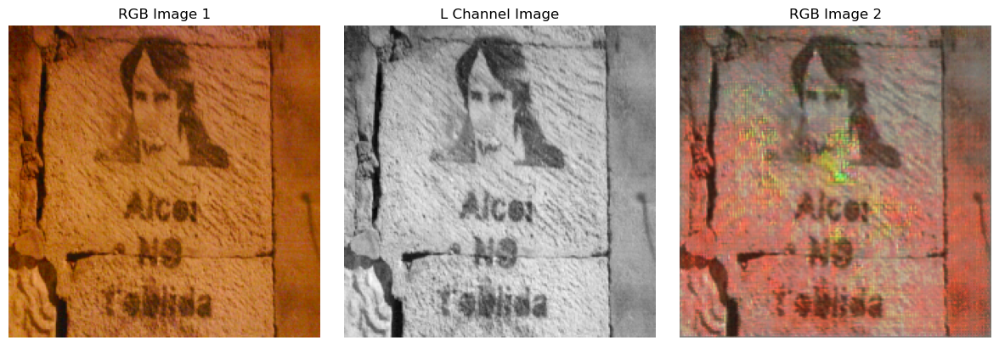

  0%|          | 0/157 [00:00<?, ?it/s]

Epoch [139/151], loss_g: 15.1194, loss_d: 1.4710, real_loss_d: 0.8654, fake_loss_d: 0.6056, fake_loss_g: 0.9703, distance_loss_g: 14.1491, duration: 1276.6328


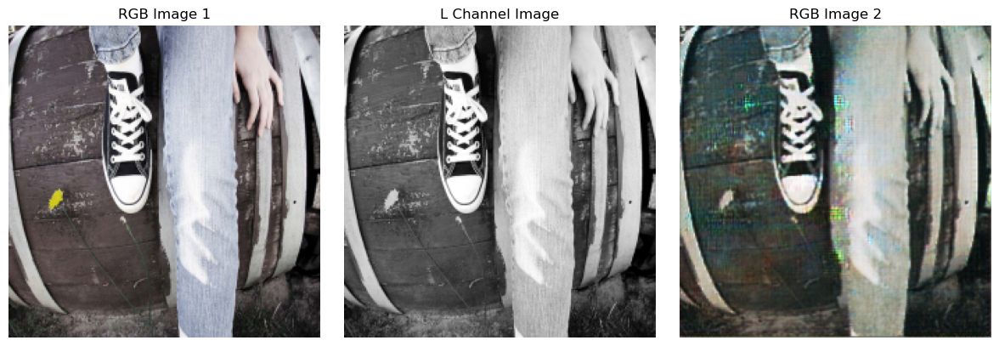

  0%|          | 0/157 [00:00<?, ?it/s]

Epoch [140/151], loss_g: 15.2581, loss_d: 1.4992, real_loss_d: 0.8696, fake_loss_d: 0.6296, fake_loss_g: 0.9834, distance_loss_g: 14.2747, duration: 1376.1017


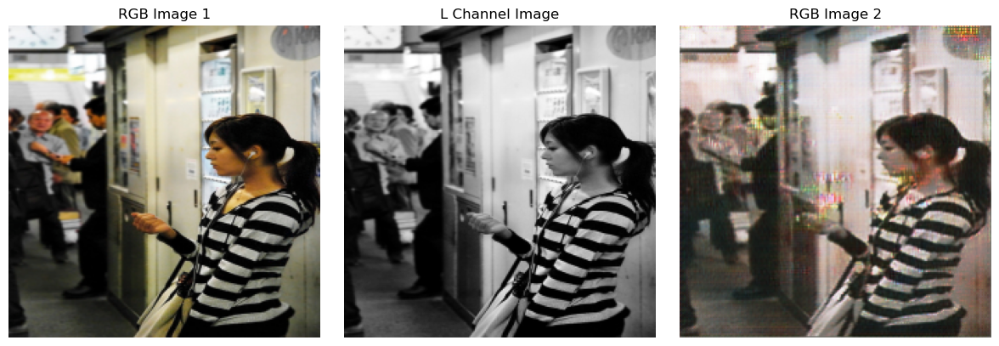

  0%|          | 0/157 [00:00<?, ?it/s]

Epoch [141/151], loss_g: 15.0340, loss_d: 1.4266, real_loss_d: 0.8403, fake_loss_d: 0.5862, fake_loss_g: 1.0067, distance_loss_g: 14.0273, duration: 1481.7183


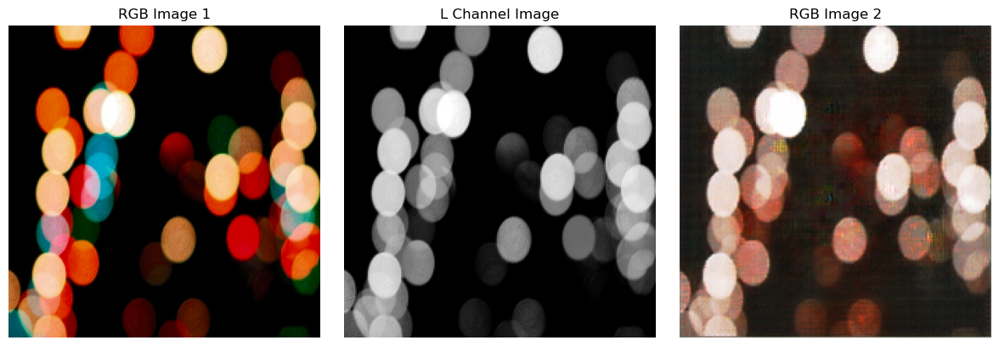

Model saved at epoch 141
Model saved at epoch 141


  0%|          | 0/157 [00:00<?, ?it/s]

Epoch [142/151], loss_g: 14.9519, loss_d: 1.4837, real_loss_d: 0.8942, fake_loss_d: 0.5894, fake_loss_g: 0.9648, distance_loss_g: 13.9870, duration: 1566.8134


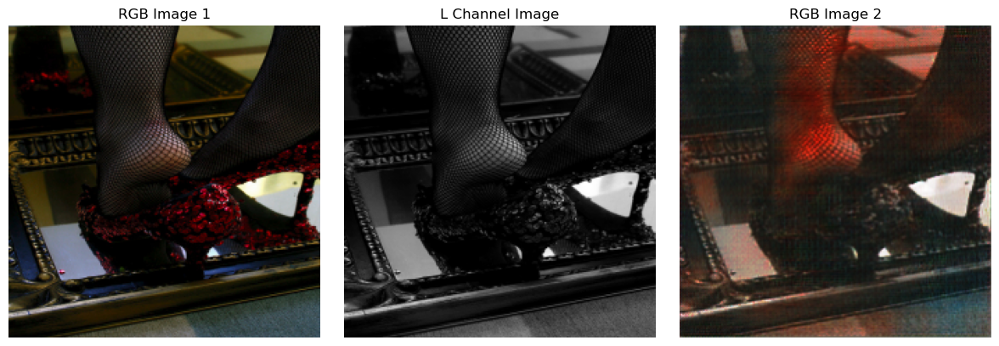

  0%|          | 0/157 [00:00<?, ?it/s]

Epoch [143/151], loss_g: 14.8105, loss_d: 1.4064, real_loss_d: 0.8311, fake_loss_d: 0.5753, fake_loss_g: 0.9774, distance_loss_g: 13.8331, duration: 1660.2303


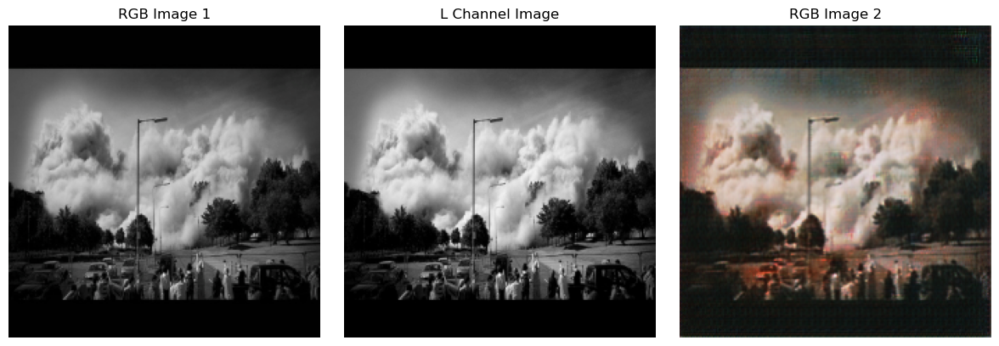

  0%|          | 0/157 [00:00<?, ?it/s]

Epoch [144/151], loss_g: 14.3494, loss_d: 1.7663, real_loss_d: 0.8681, fake_loss_d: 0.8982, fake_loss_g: 0.6684, distance_loss_g: 13.6810, duration: 1750.8513


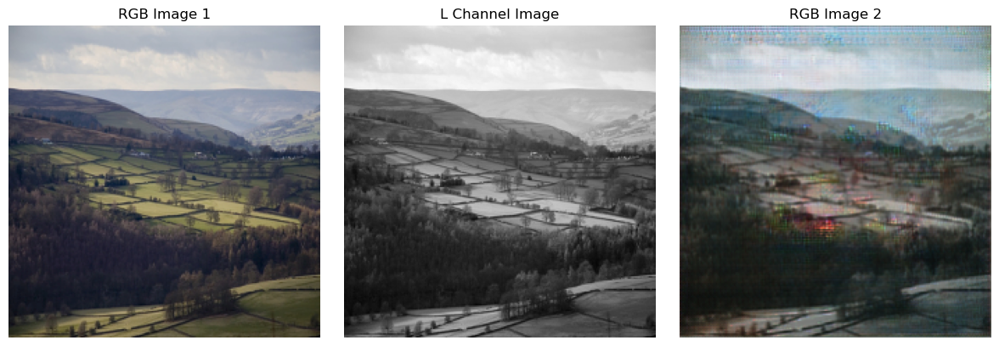

  0%|          | 0/157 [00:00<?, ?it/s]

Epoch [145/151], loss_g: 14.0965, loss_d: 1.7225, real_loss_d: 0.6688, fake_loss_d: 1.0537, fake_loss_g: 0.5779, distance_loss_g: 13.5186, duration: 1848.1128


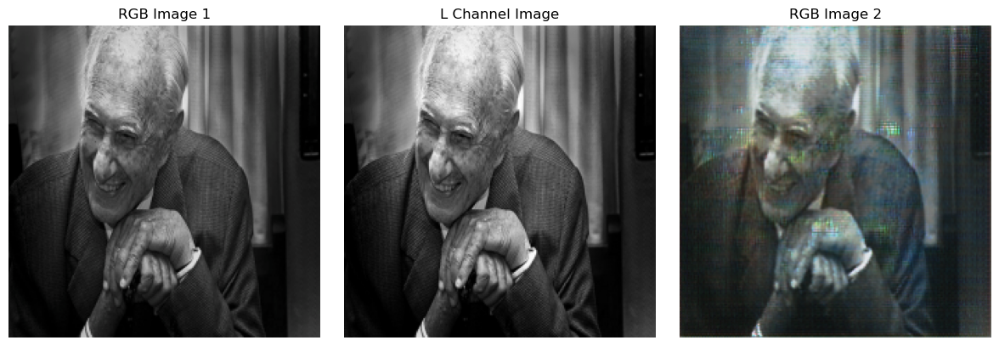

  0%|          | 0/157 [00:00<?, ?it/s]

Epoch [146/151], loss_g: 13.8813, loss_d: 1.6060, real_loss_d: 0.5539, fake_loss_d: 1.0521, fake_loss_g: 0.5871, distance_loss_g: 13.2942, duration: 1933.6443


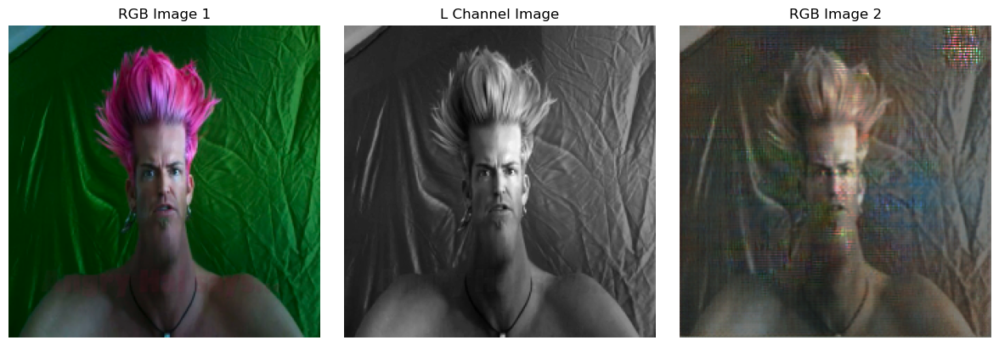

Model saved at epoch 146
Model saved at epoch 146


  0%|          | 0/157 [00:00<?, ?it/s]

Epoch [147/151], loss_g: 14.1987, loss_d: 1.6279, real_loss_d: 0.6312, fake_loss_d: 0.9967, fake_loss_g: 0.6700, distance_loss_g: 13.5286, duration: 2035.7326


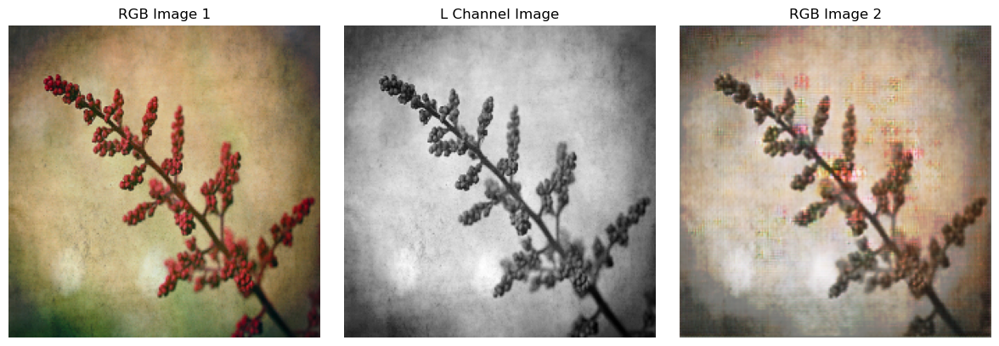

  0%|          | 0/157 [00:00<?, ?it/s]

Epoch [148/151], loss_g: 14.2193, loss_d: 1.4818, real_loss_d: 0.6997, fake_loss_d: 0.7821, fake_loss_g: 0.7935, distance_loss_g: 13.4257, duration: 2131.7444


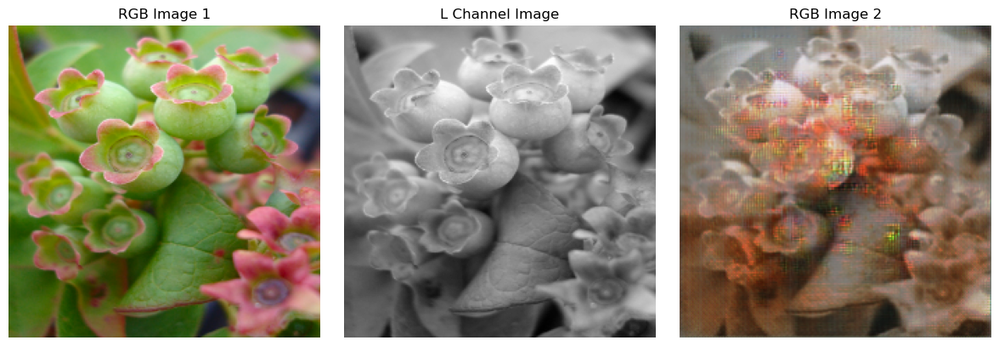

  0%|          | 0/157 [00:00<?, ?it/s]

Epoch [149/151], loss_g: 14.2519, loss_d: 1.8139, real_loss_d: 1.1194, fake_loss_d: 0.6945, fake_loss_g: 0.8257, distance_loss_g: 13.4262, duration: 2226.9194


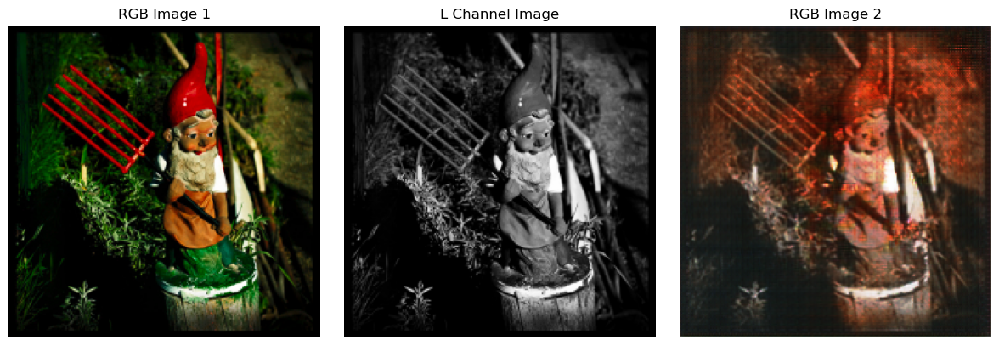

  0%|          | 0/157 [00:00<?, ?it/s]

Epoch [150/151], loss_g: 14.3625, loss_d: 1.7219, real_loss_d: 1.0829, fake_loss_d: 0.6390, fake_loss_g: 0.8793, distance_loss_g: 13.4832, duration: 2320.9941


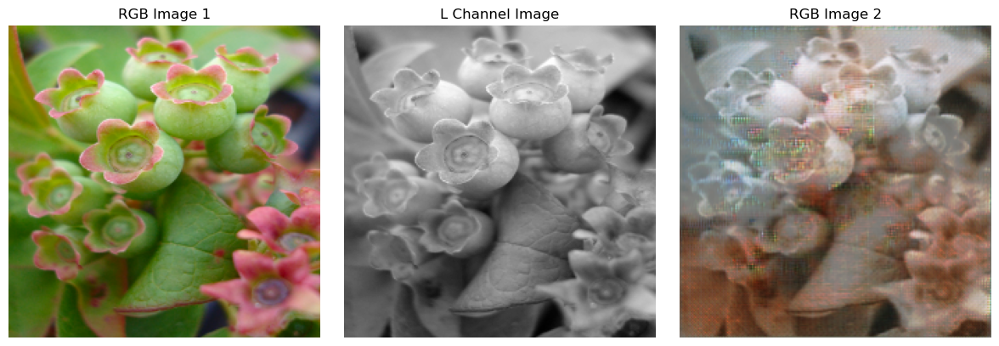

  0%|          | 0/157 [00:00<?, ?it/s]

Epoch [151/151], loss_g: 14.2770, loss_d: 1.6899, real_loss_d: 1.0735, fake_loss_d: 0.6164, fake_loss_g: 0.9049, distance_loss_g: 13.3721, duration: 2429.6119


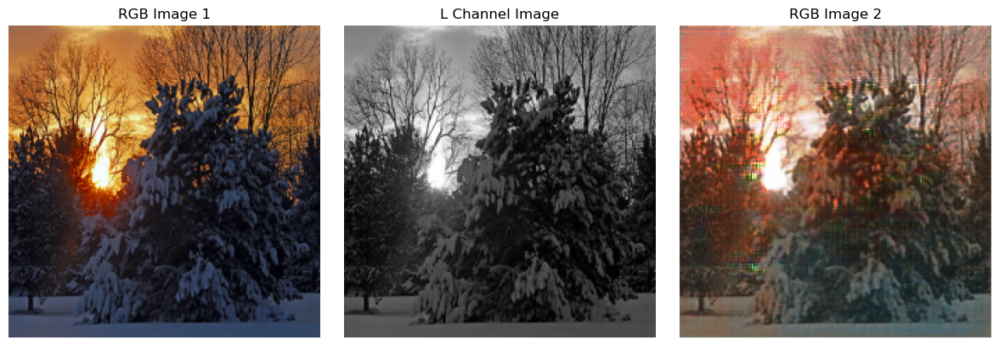

Model saved at epoch 151
Model saved at epoch 151


In [69]:
history = fit(151)

In [70]:
losses_g, losses_d, real_losses_d, fake_losses_d, fake_losses_g, distance_losses_g = history

Text(0.5, 1.0, 'Losses')

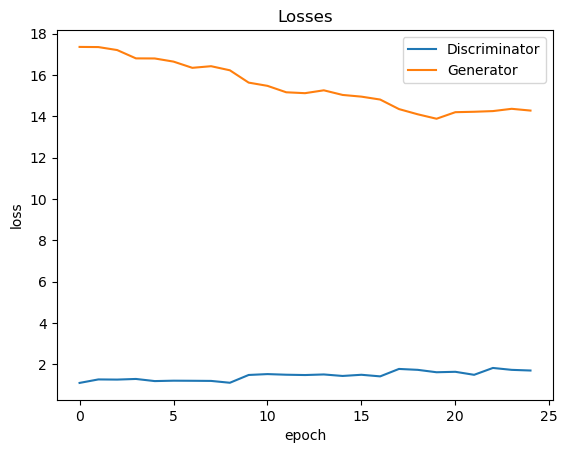

In [71]:
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses')

Text(0.5, 1.0, 'd_losses')

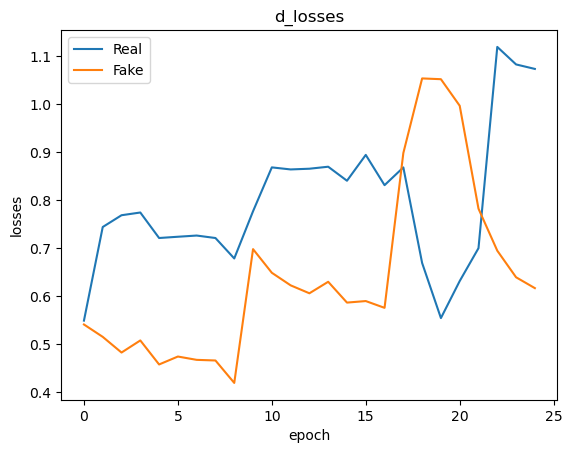

In [72]:
real_losses_d = np.array([loss.cpu().detach().numpy() for loss in real_losses_d])
fake_losses_d = np.array([loss.cpu().detach().numpy() for loss in fake_losses_d])

plt.plot(real_losses_d, '-')
plt.plot(fake_losses_d, '-')
plt.xlabel('epoch')
plt.ylabel('losses')
plt.legend(['Real', 'Fake'])
plt.title('d_losses')

Text(0.5, 1.0, 'g_losses')

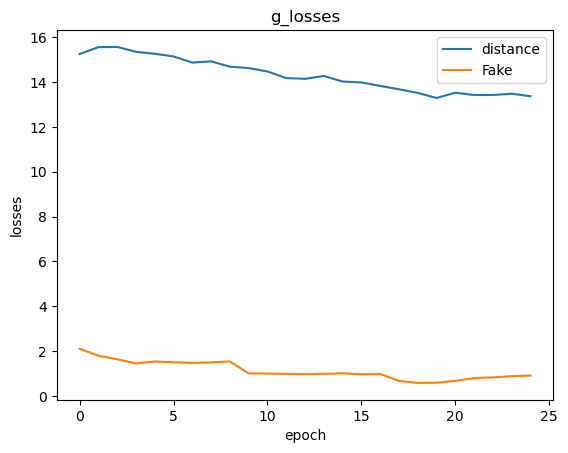

In [73]:
distance_losses_g = np.array([loss.cpu().detach().numpy() for loss in distance_losses_g])
fake_losses_g = np.array([loss.cpu().detach().numpy() for loss in fake_losses_g])

plt.plot(distance_losses_g, '-')
plt.plot(fake_losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('losses')
plt.legend(['distance', 'Fake'])
plt.title('g_losses')

In [74]:
generator = Generator()  

checkpoint = torch.load(r"new_check\gen\gen151.pth")

generator.load_state_dict(checkpoint['model_state_dict'])

generator = generator.to(device)

generator.eval()

print(f"Loaded Generator from Epoch: {checkpoint['epoch']}")
print(f"Last Generator Loss: {checkpoint['loss']}")


Loaded Generator from Epoch: 150
Last Generator Loss: 14.276951753409804


C:\Users\Vikash kumar singh\AppData\Local\Temp\ipykernel_21160\826353777.py:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(r"new_check\gen\gen151.p

In [75]:
import numpy as np
import matplotlib.pyplot as plt

def show_image(bw_image_tensor, rgb_image_tensor):
    if bw_image_tensor.is_cuda:
        bw_image_tensor = bw_image_tensor.cpu()
    if rgb_image_tensor.is_cuda:
        rgb_image_tensor = rgb_image_tensor.cpu()

    bw_image_np = bw_image_tensor.detach().numpy()
    rgb_image_np = rgb_image_tensor.detach().numpy()
    
    bw_image_np = (bw_image_np + 1) / 2 * 255  

    bw_image_np = bw_image_np.astype(np.uint8).squeeze()  

    rgb_image_np = (rgb_image_np + 1) / 2 * 255  

    rgb_image_np = rgb_image_np.astype(np.uint8)

    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    axes[0].imshow(bw_image_np, cmap='gray')
    axes[0].axis('off')
    axes[0].set_title('Black and White Image')

    axes[1].imshow(rgb_image_np.transpose(1, 2, 0))  
    axes[1].axis('off')
    axes[1].set_title('Generated RGB Image')

    plt.show()


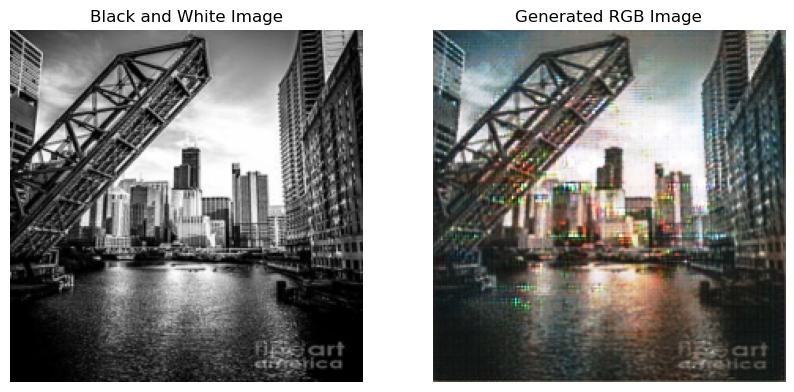

In [79]:
from PIL import Image
import torchvision.transforms as transforms

path = r"chicago-kinzie-street-bridge-black-and-white-picture-paul-velgos.jpg"
image = Image.open(path).convert('L')  

transform = transforms.Compose([
    transforms.Resize((224, 224)), 
    transforms.ToTensor(),          
    transforms.Normalize(mean=[0.5], std=[0.5]) 
])

l_image = transform(image).unsqueeze(0).to(device)

with torch.no_grad():
    colorized_output = generator(l_image)

colorized_image = colorized_output.squeeze(0)

show_image(l_image,colorized_image)